<a href="https://colab.research.google.com/github/melihkurtaran/ImageAnalysisProject/blob/main/ImageProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Dowloading and Importing Libraries**

In [1]:
!pip install --upgrade scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.5 MB 458 kB/s 
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.18.3
    Uninstalling scikit-image-0.18.3:
      Successfully uninstalled scikit-image-0.18.3


In [2]:
!pip install pixelmatch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import cv2
import numpy as np
import pandas as pd
import os
import glob
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from PIL import Image
from pixelmatch.contrib.PIL import pixelmatch
from numpy import asarray
# import the math module 
import math 

# **GitHub Data Access**

In [4]:
!git clone https://github.com/melihkurtaran/ImageAnalysisProject.git

Cloning into 'ImageAnalysisProject'...
remote: Enumerating objects: 73, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 73 (delta 1), reused 4 (delta 1), pack-reused 67
Unpacking objects: 100% (73/73), done.


In [5]:
# storing the images in data folder
image_files = glob.glob ("ImageAnalysisProject/data/*.jpg")
image_files

['ImageAnalysisProject/data/1660453200.jpg',
 'ImageAnalysisProject/data/1660482000.jpg',
 'ImageAnalysisProject/data/1660460400.jpg',
 'ImageAnalysisProject/data/1660464000.jpg',
 'ImageAnalysisProject/data/1660485600.jpg',
 'ImageAnalysisProject/data/1660478400.jpg',
 'ImageAnalysisProject/data/1660471200.jpg',
 'ImageAnalysisProject/data/1660456800.jpg',
 'ImageAnalysisProject/data/1660467600.jpg',
 'ImageAnalysisProject/data/1660474800.jpg']

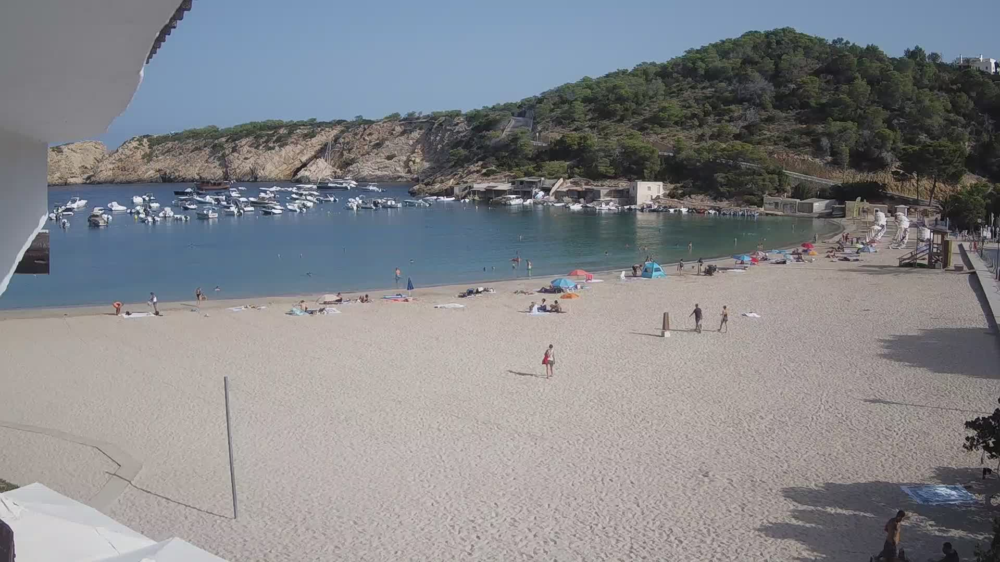

In [6]:
# An example of an image
img = cv2.imread(image_files[3], 1)
cv2_imshow(img)

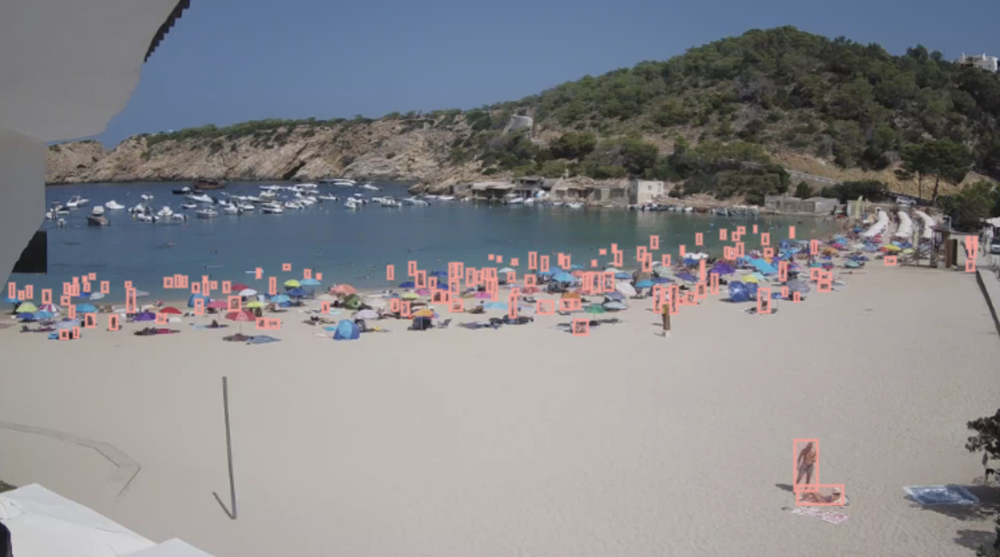

In [7]:
#An example of annotated version of the image
ann_images = glob.glob ("ImageAnalysisProject/annotated_examples/*.jpg")
a_img = cv2.imread(ann_images[2], 1)
cv2_imshow(a_img)

In [8]:
#Get label csv
df_labels = pd.read_csv('ImageAnalysisProject/personLabels.csv')
df_labels.sample(10)

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
674,Person,424,523,9,12,1660482000.jpg,1920,1080
501,Person,1258,485,8,20,1660478400.jpg,1920,1080
619,Person,1449,578,15,24,1660482000.jpg,1920,1080
69,Person,68,552,18,31,1660467600.jpg,1920,1080
357,Person,1075,493,8,35,1660474800.jpg,1920,1080
31,Person,1381,584,18,58,1660464000.jpg,1920,1080
698,Person,509,533,10,12,1660482000.jpg,1920,1080
870,Person,1821,495,13,27,1660485600.jpg,1920,1080
841,Person,1600,459,4,7,1660485600.jpg,1920,1080
731,Person,1892,508,7,38,1660485600.jpg,1920,1080


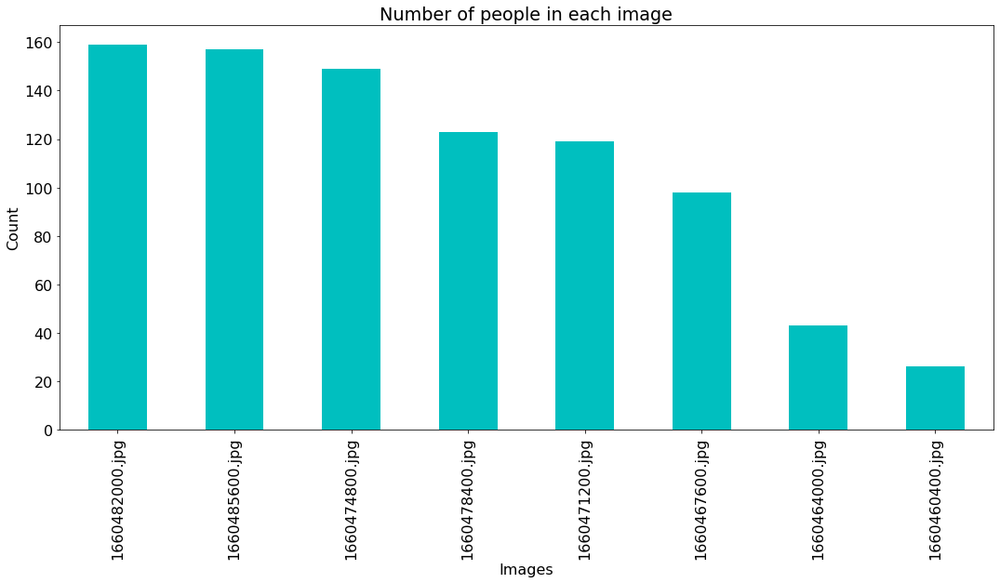

In [9]:
plt.figure()
plt.rcParams.update({'font.size': 16})
df_labels['image_name'].value_counts().plot(kind='bar',color="c",figsize=(18, 8),
                                            title="Number of people in each image",
                                            xlabel="Images", ylabel="Count")

In [10]:
#Image Files to Images
images = []
for fil in image_files:
    i = cv2.imread(fil, 1)
    images.append(i)
print("Images are ready to use")


Images are ready to use


# **Image Processing**

Several Techniques are implemented in this section

In [11]:
# Image 2 and Image 6 are the empty images so they will be used for averaging/PIXEL-WISE comparison

#image 2 (darrkish empty)
d_empty_img = images[2]

#image 6 (brigthish empty)
b_empty_img = images[6]

## **Image Averaging**

Trying image averaging on two examples with one bright and one darker one

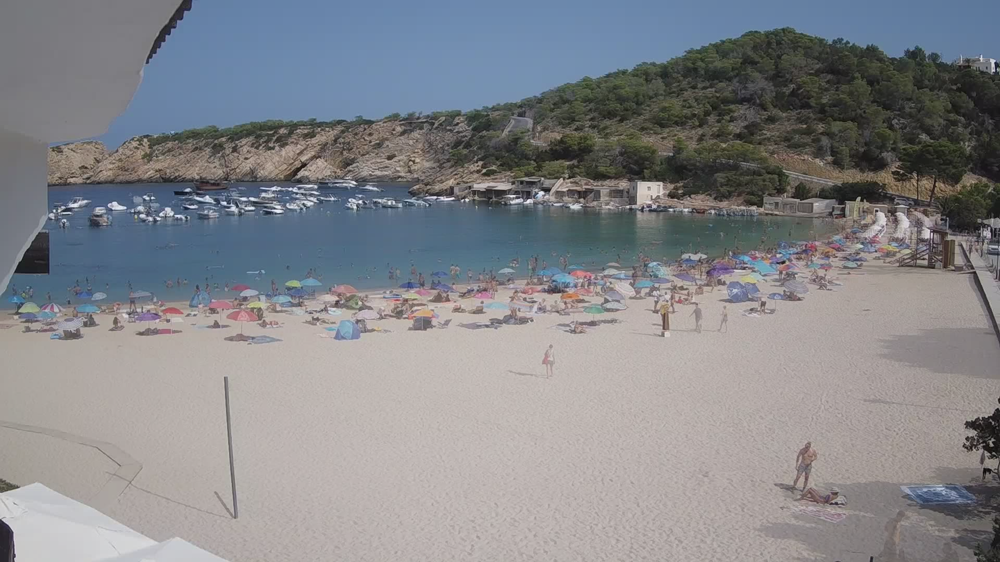

In [12]:
# Bright image example (images[3])

alpha = 0.4
beta = 1.0 - alpha

avg_image = images[3]
avg_image = cv2.addWeighted(images[3], alpha, b_empty_img, beta, 0.0)
cv2_imshow(avg_image)

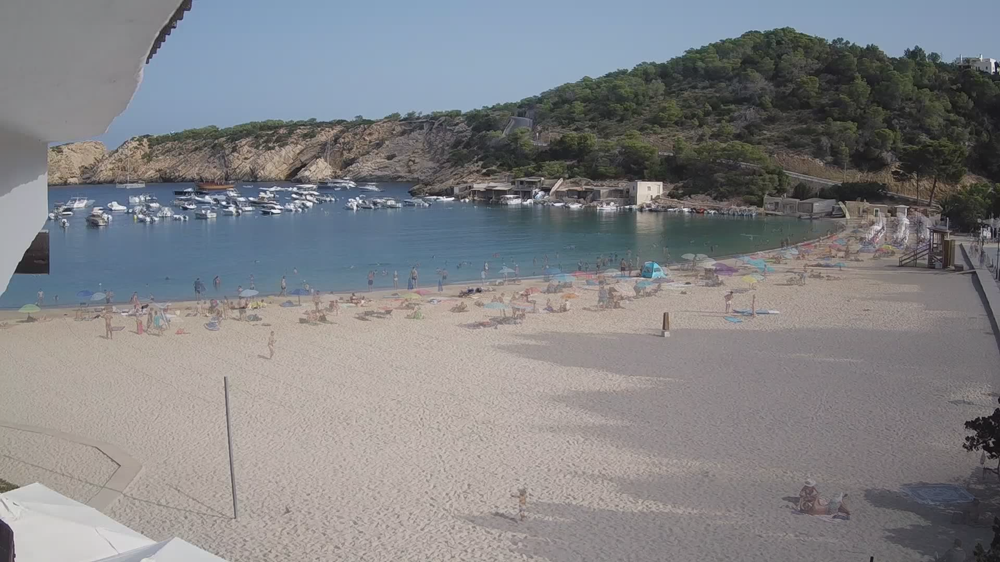

In [13]:
# Darker image example (images[8])

alpha = 0.4
beta = 1.0 - alpha

avg_image = images[8]

avg_image = cv2.addWeighted(images[8], alpha, d_empty_img, beta, 0.0)
cv2_imshow(avg_image)

## **Pixel-wise Comparison**

6 images are brighter and 2 images are darker

In [14]:
# B: Image 0,1,2,4,5,6
# D: Image 3,8
image_files

['ImageAnalysisProject/data/1660453200.jpg',
 'ImageAnalysisProject/data/1660482000.jpg',
 'ImageAnalysisProject/data/1660460400.jpg',
 'ImageAnalysisProject/data/1660464000.jpg',
 'ImageAnalysisProject/data/1660485600.jpg',
 'ImageAnalysisProject/data/1660478400.jpg',
 'ImageAnalysisProject/data/1660471200.jpg',
 'ImageAnalysisProject/data/1660456800.jpg',
 'ImageAnalysisProject/data/1660467600.jpg',
 'ImageAnalysisProject/data/1660474800.jpg']

In [15]:
def pixelWiseCompare(image1,image2):
  # Pixel-wise differences between two images are stored in "img_diff."
  size = (1920,1080)
  img_diff = Image.new("RGBA", size)
  mismatch = pixelmatch(image1, image2, img_diff, threshold=0.05,includeAA=True,diff_color=[0, 0, 0])
  print("number of mismatched pixels {}".format(mismatch))
  return img_diff


number of mismatched pixels 331383


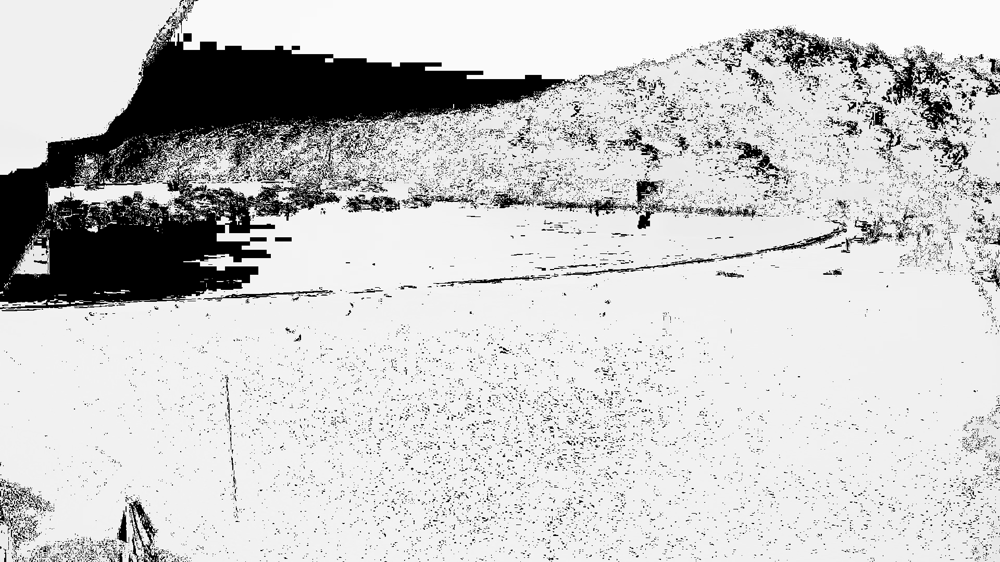

number of mismatched pixels 1214396


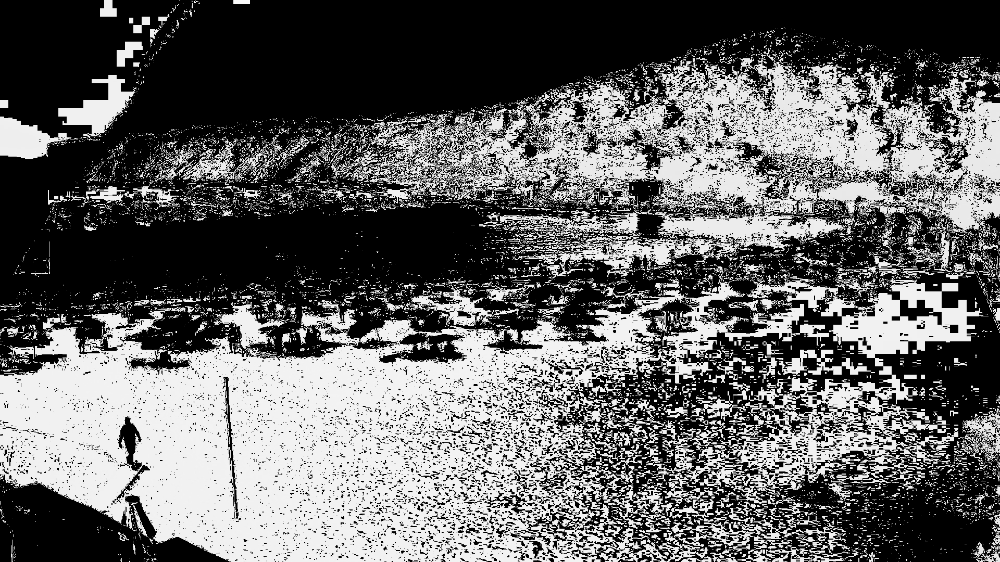

number of mismatched pixels 1502916


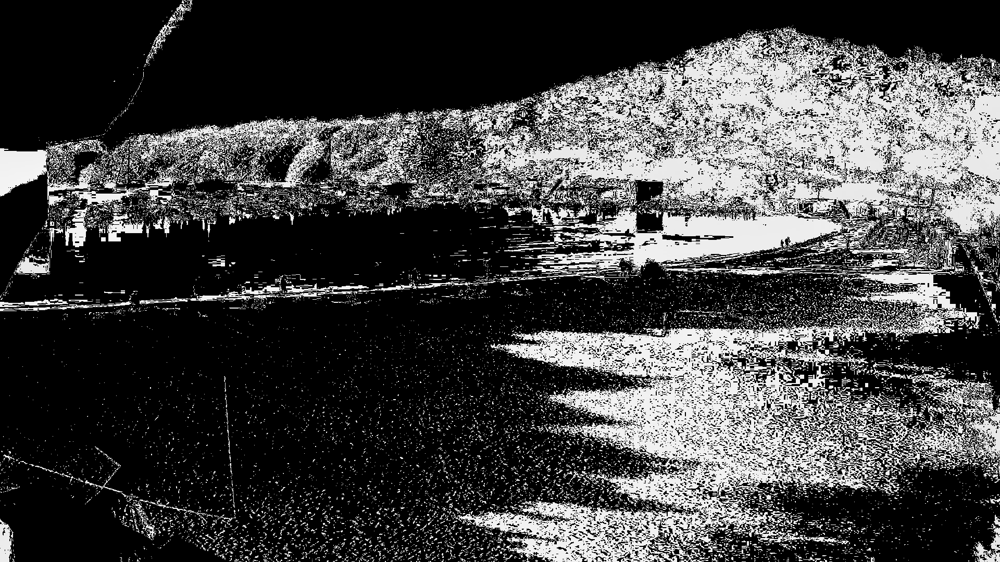

number of mismatched pixels 1772084


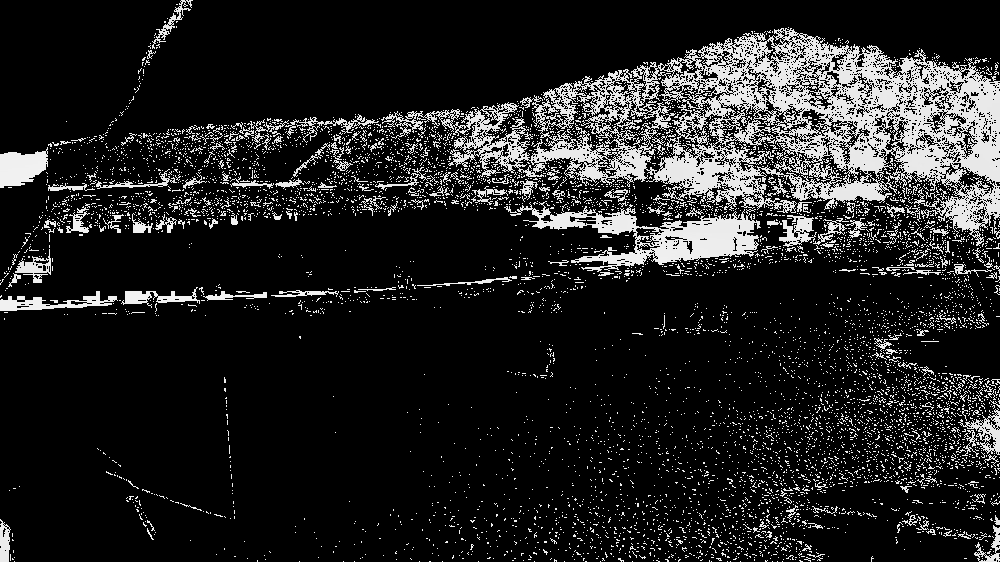

number of mismatched pixels 1771724


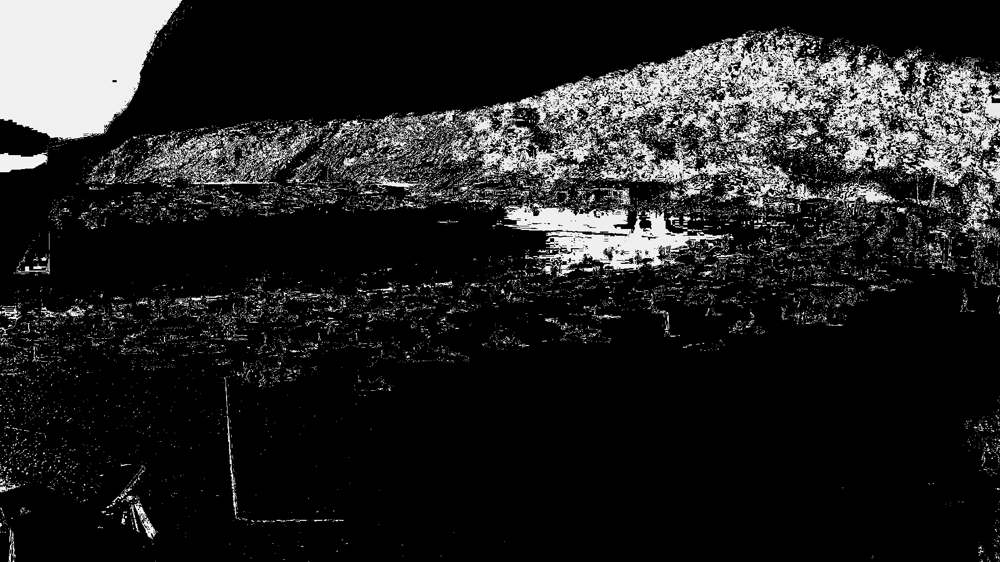

number of mismatched pixels 1765340


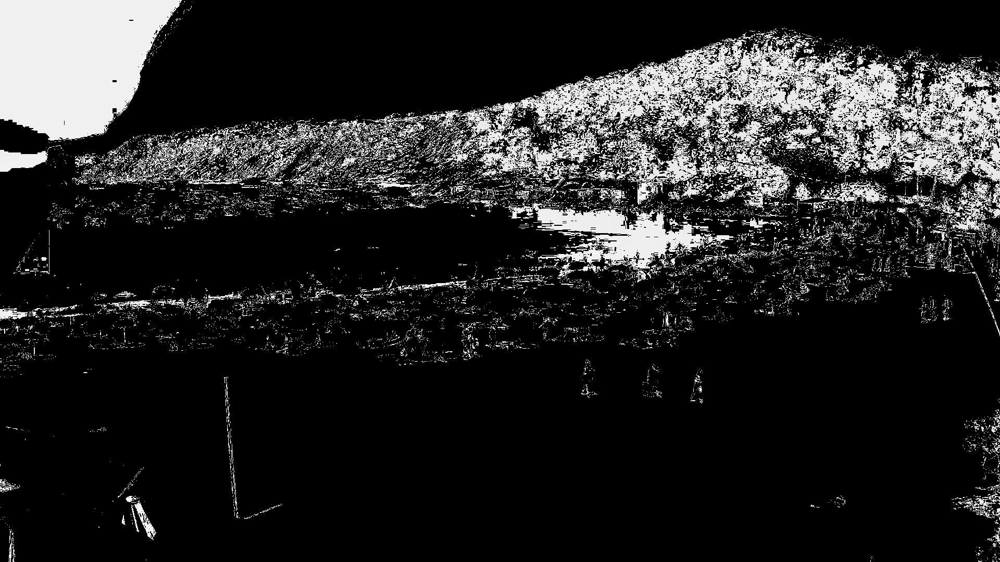

number of mismatched pixels 1789378


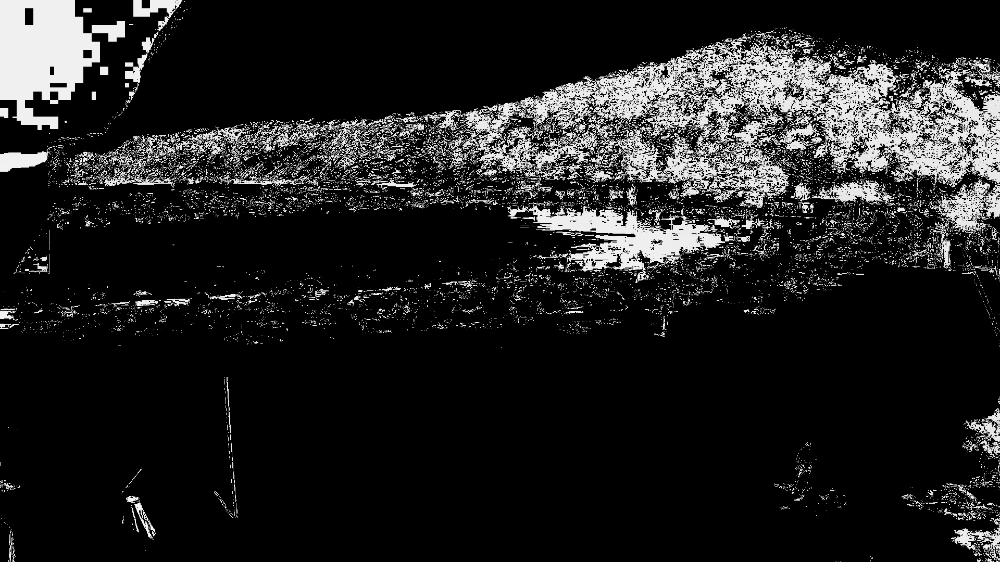

number of mismatched pixels 0


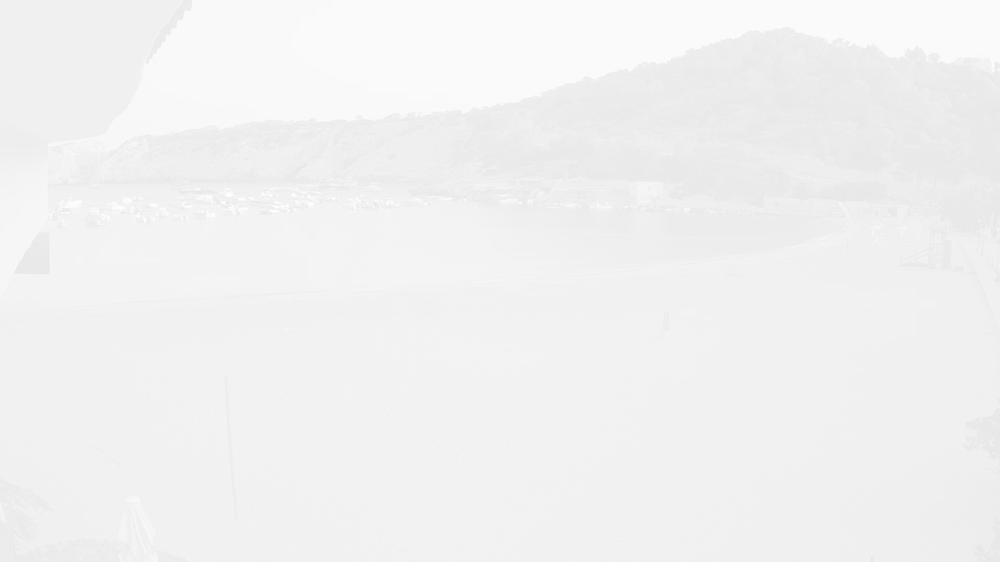

number of mismatched pixels 1824387


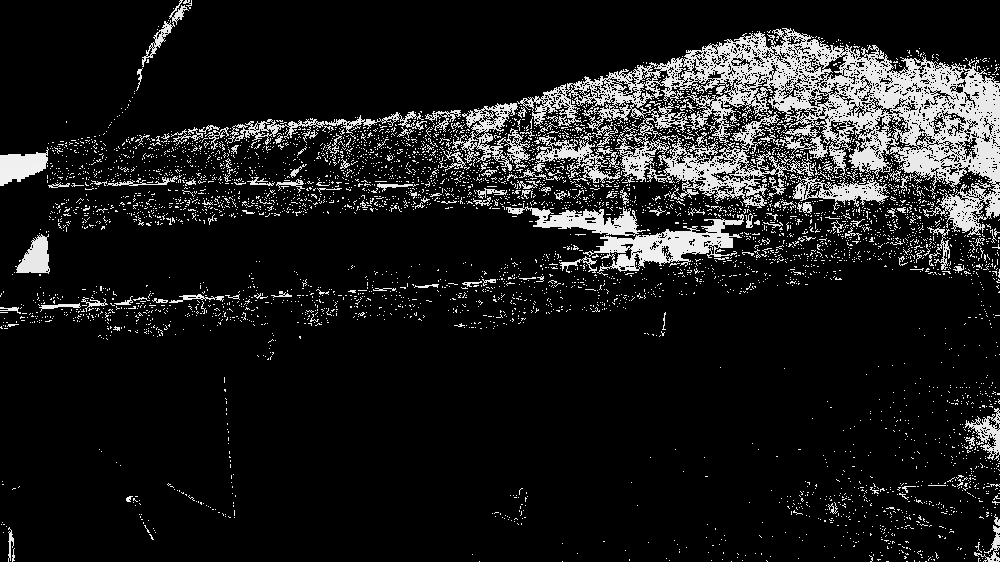

number of mismatched pixels 1231052


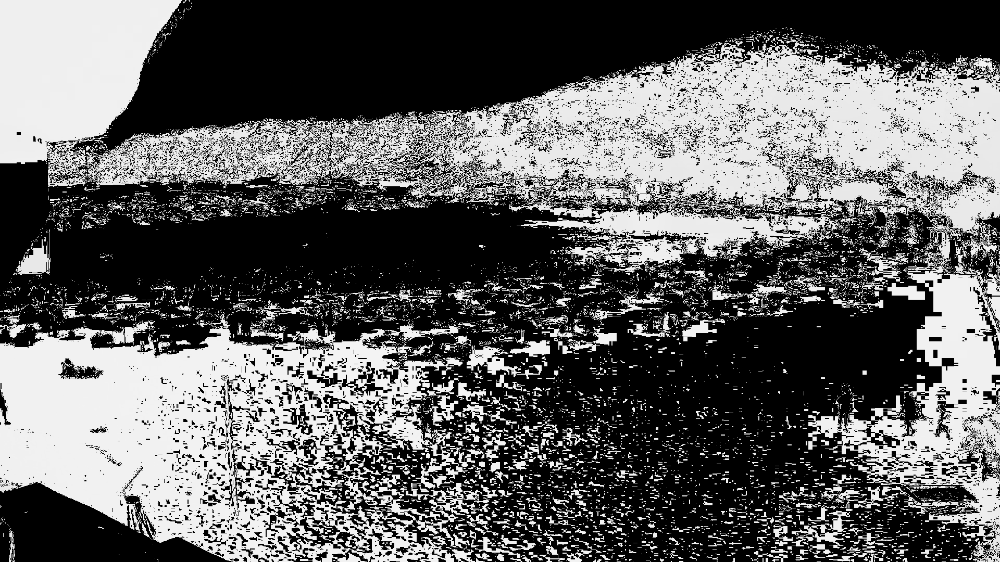

In [16]:
brightEmpty = Image.open("/content/ImageAnalysisProject/data/1660456800.jpg")
darktEmpty = Image.open("/content/ImageAnalysisProject/data/1660453200.jpg")

pc_images = []
# For the brighter and darkerimages
for i in range(len(image_files)):
  imageToCompare = Image.open("/content/"+image_files[i])
  if i in [0,1,2,4,5,6,7]:
    res = pixelWiseCompare(brightEmpty,imageToCompare)
  else:
    res = pixelWiseCompare(darktEmpty,imageToCompare)
  img_dif = asarray(res) #change its type
  pc_images.append(img_dif)
  cv2_imshow(img_dif)


## **Background Removal**

In [17]:
#Function to remove the background
def bgremove1(img):
    # Blur to image to reduce noise
    img = cv2.GaussianBlur(img,(11,11), 0)
 
    # We bin the pixels. Result will be a value 1..5
    bins=np.array([0,51,102,153,204,255])
    img[:,:,:] = np.digitize(img[:,:,:],bins,right=True)*51
 
    # Create single channel greyscale for thresholding
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
 
    # Perform Otsu thresholding and extract the background.
    # We use Binary Threshold as we want to create an all white background
    ret,background = cv2.threshold(img_grey,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
 
    # Convert black and white back into 3 channel greyscale
    background = cv2.cvtColor(background, cv2.COLOR_GRAY2BGR)
 
    # Perform Otsu thresholding and extract the foreground.
    # We use TOZERO_INV as we want to keep some details of the foregorund
    ret,foreground = cv2.threshold(img_grey,0,255,cv2.THRESH_TOZERO_INV+cv2.THRESH_OTSU)  #Currently foreground is only a mask
    foreground = cv2.bitwise_and(img,img, mask=foreground)  # Update foreground with bitwise_and to extract real foreground
 
    # Combine the background and foreground to obtain our final image
    finalimage = background+foreground
 
    return finalimage

In [18]:
bg_images = []
for i in range(len(images)):
   bg_images.append(bgremove1(images[i]))

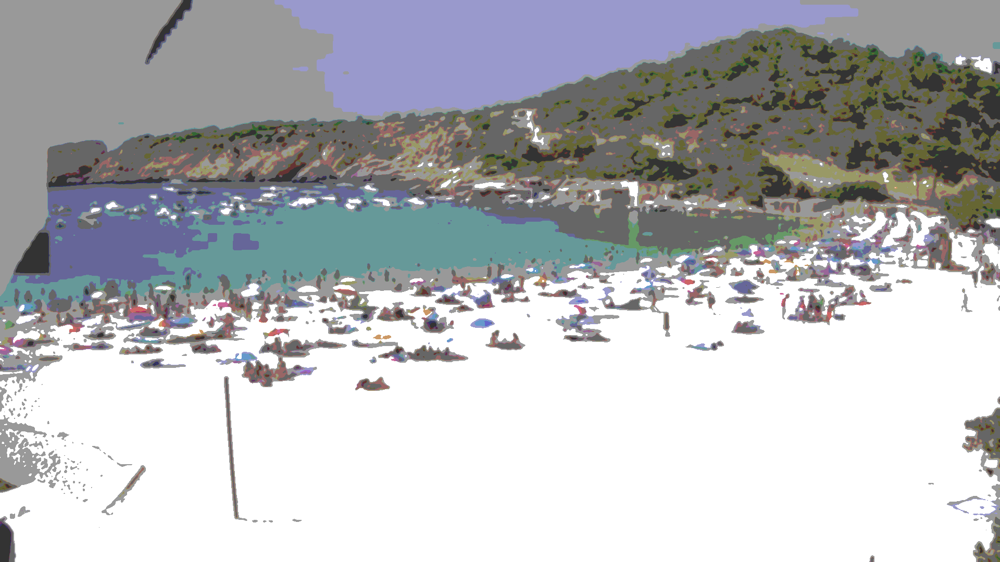

In [19]:
cv2_imshow(bg_images[4])

## **Contour Detection**

In [20]:
#i is either the result of pixel-wise comparison or Background Removal
def findContours(image,img_tec,i): #returns image, count and df labels
  img_gray = cv2.cvtColor(img_tec, cv2.COLOR_BGR2GRAY)
  df = pd.DataFrame(columns=['bbox_x','bbox_y',"bbox_width",'bbox_height','image_name'])
  # Find Canny edges
  edged = cv2.Canny(img_gray, 30, 200)  
  contours, hierarchy = cv2.findContours(edged, 
      cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  frame = image.copy() 
  count = 0
  for contour in contours:
      # Find bounding rectangles
      x,y,w,h = cv2.boundingRect(contour)
      # Draw the rectangle
      if (h>10 and w >10 and h<100 and w<100) and y>500:
        cv2.rectangle(frame,(x,y),(x+w,y+h),(120,90,250),2)
        count += 1
        new_row = {'bbox_x':x, 'bbox_y':y, 'bbox_width':w, 'bbox_height':h, 'image_name':image_files[i][26:]}
        #append row to the dataframe
        df = df.append(new_row, ignore_index=True)
  return frame, count, df

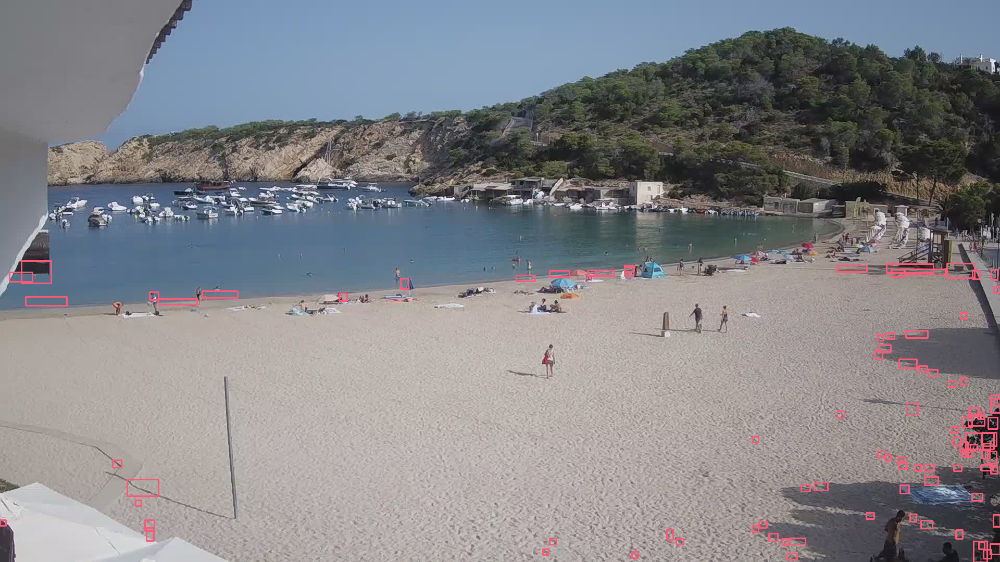

In [50]:
# For Pixel-wise Comparison Results

df_predicted_PC = pd.DataFrame(columns=['bbox_x','bbox_y',"bbox_width",'bbox_height','image_name'])
res_pc_images = []
for i in range(len(images)):
  frame , count, df = findContours(images[i],pc_images[i],i)
  res_pc_images.append(frame)
  df_predicted_PC = df_predicted_PC.append(df)

#Example
cv2_imshow(res_pc_images[3])


Predicted number of people for image: 0 is 19
Predicted number of people for image: 1 is 105
Predicted number of people for image: 2 is 59
Predicted number of people for image: 3 is 24
Predicted number of people for image: 4 is 185
Predicted number of people for image: 5 is 149
Predicted number of people for image: 6 is 124
Predicted number of people for image: 7 is 22
Predicted number of people for image: 8 is 57
Predicted number of people for image: 9 is 102


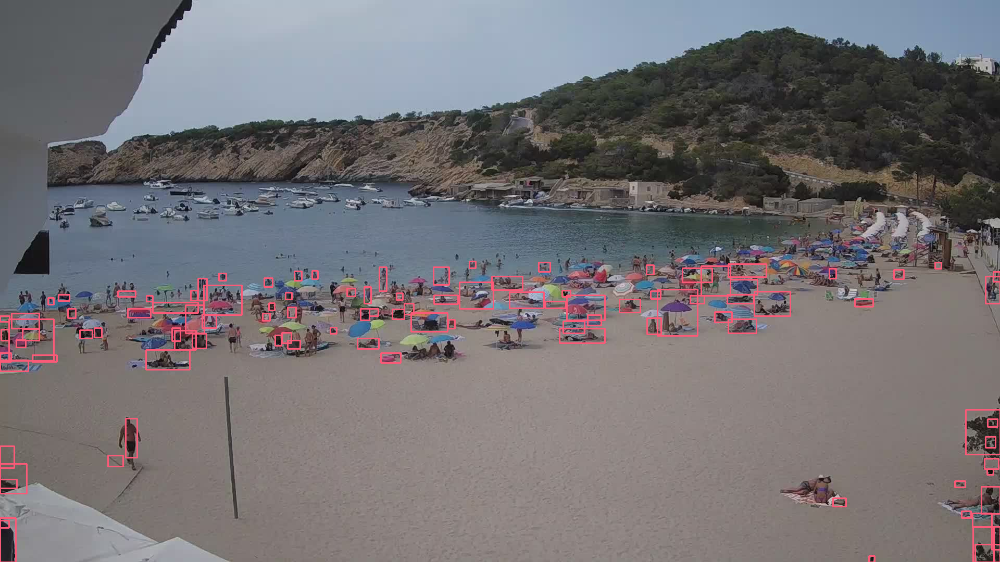

In [22]:
# For Background Removal Results
df_predicted_BG = pd.DataFrame(columns=['bbox_x','bbox_y',"bbox_width",'bbox_height','image_name'])
res_bg_images = []
for i in range(len(images)):
  frame , count, df = findContours(images[i],bg_images[i],i)
  res_bg_images.append(frame)
  df_predicted_BG = df_predicted_BG.append(df)
  print("Predicted number of people for image: " + str(i) + " is " + str(count) )

#Example
cv2_imshow(res_bg_images[1])

In [23]:
len(res_bg_images)

10

In [24]:
df_predicted_PC

,bbox_x,bbox_y,bbox_width,bbox_height,image_name
0,1871,1069,11,11,1660453200.jpg
1,147,1067,24,13,1660453200.jpg
2,96,1059,17,21,1660453200.jpg
3,203,1056,19,18,1660453200.jpg
4,295,1054,19,15,1660453200.jpg
...,...,...,...,...,...
628,1148,506,68,13,1660474800.jpg
629,1837,505,39,29,1660474800.jpg
630,1798,505,22,17,1660474800.jpg
631,1660,503,35,26,1660474800.jpg


# **Validation**

## **Person Level**

Precision: TP / (TP + FP) and Sensitivity: TP / (number of actual label)

In [46]:
import numbers
#print the boxes for a given image
def validateBoxes(images,df_predicts,im):
  #TP:corrcect boxes, FP:wrong boxes, MS:missed boxes
  df = pd.DataFrame(columns=['Precision','Sensitivity','TP','FP','numOfActual','image_name'])
  numOfActual = 0
  TP = 0
  FP = 0
  df_predict = df_predicts[df_predicts['image_name'] == image_files[im][26:]]
  image = images[im].copy()
  boxes = df_labels[ df_labels["image_name"] == image_files[im][26:]]
  for i in range(len(boxes)):
    x = boxes.iloc[i]["bbox_x"]
    y = boxes.iloc[i]["bbox_y"]
    w = boxes.iloc[i]["bbox_width"]
    h = boxes.iloc[i]["bbox_height"]
    cv2.rectangle(image,(x,y),(x+w,y+h),(150,50,40),2)  #actual ones
    numOfActual += 1
  
  for i in range(len(df_predict)):
    x = df_predict.iloc[i]["bbox_x"]
    y = df_predict.iloc[i]["bbox_y"]
    w = df_predict.iloc[i]["bbox_width"]
    h = df_predict.iloc[i]["bbox_height"]
    drawnRed = False #To keep track of if already drawn red
    for j in range(len(boxes)):
      x2 = boxes.iloc[j]["bbox_x"]
      y2 = boxes.iloc[j]["bbox_y"]
      w2 = boxes.iloc[j]["bbox_width"]
      h2 = boxes.iloc[j]["bbox_height"]
      #some advanced math for box match calculation (all conditions are checked)
      if((((x2>=x) and (x2<=x+w) and (y2>=y) and (y2<=y+h)) or ((x2+w2>=x) and (x2+w2<=x+w) and (y2+h2>=y) and (y2+h2<=y+h)))
      or (((x2+w2>=x) and (x2+w2<=x+w) and (y2>=y) and (y2<=y+h)) or ((x2>=x) and (x2<=x+w) and (y2+h2>=y) and (y2+h2<=y+h)))
      or (((x>=x2) and (x<=x2+w2) and (y>=y2) and (y<=y2+h2)) or ((x+w>=x2) and (x+w<=x2+w2) and (y+h>=y2) and (y+h<=y2+h2)))
      or ((x+w>=x2) and (x+w<=x2+w2) and (y>=y2) and (y<=y2+h2)) or ((x>=x2) and (x<=x2+w2) and (y+h>=y2) and (y+h<=y2+h2))
      or ((x<=x2)and(y>=y2)and(x+w>=x2+w2)and(y+h<=y2+h2))):
        cv2.rectangle(image,(x,y),(x+w,y+h),(0,250,0),2)  #correct ones
        TP += 1
        break
      else:
        if not drawnRed:
          cv2.rectangle(image,(x,y),(x+w,y+h),(0,0,250),2)  #wrong ones
          drawnRed = True
    if drawnRed:
      FP += 1
  if numOfActual == 0: #if empty image pass
    return image, df
  else:
    acc = TP / (TP + FP)
    pre = TP / numOfActual
    new_row = {'Precision':round(acc, 2), 'Sensitivity':round(pre, 2), 'TP':TP, 'FP':FP, 'numOfActual':numOfActual, 'image_name':image_files[im][26:] }
    #append row to the dataframe
    df = df.append(new_row, ignore_index=True)
    return image, df

In [47]:
 #string type needed for comparison
df_labels['image_name'] = df_labels['image_name'].astype(str)

Image: 1660453200.jpg
Image: 1660482000.jpg
Image: 1660460400.jpg
Image: 1660464000.jpg
Image: 1660485600.jpg
Image: 1660478400.jpg
Image: 1660471200.jpg


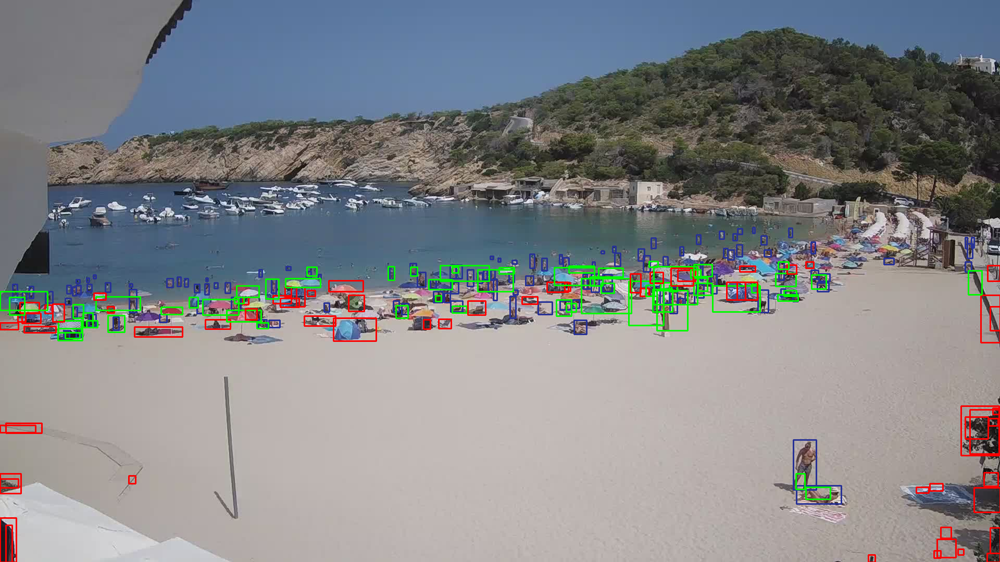

Image: 1660456800.jpg
Image: 1660467600.jpg
Image: 1660474800.jpg


In [48]:
df_accuracy = pd.DataFrame(columns=['Precision','Sensitivity','TP','FP','numOfActual','image_name'])
for i in range(len(images)):
  # df_predicted_BG or df_predicted_PC
  validated_img ,df_acc = validateBoxes(images,df_predicted_BG,i)
  df_accuracy = df_accuracy.append(df_acc, ignore_index=True)
  print("Image: " + image_files[i][26:])
  if i == 6: #as an example
    cv2_imshow(validated_img)


In [49]:
df_accuracy

,Precision,Sensitivity,TP,FP,numOfActual,image_name
0,0.38,0.39,62,103,159,1660482000.jpg
1,0.08,0.19,5,59,26,1660460400.jpg
2,0.25,0.19,8,24,43,1660464000.jpg
3,0.36,0.66,104,184,157,1660485600.jpg
4,0.31,0.54,66,148,123,1660478400.jpg
5,0.33,0.50,60,123,119,1660471200.jpg
6,0.39,0.37,36,56,98,1660467600.jpg
7,0.42,0.48,71,99,149,1660474800.jpg


Average precision:

In [29]:
sum(df_accuracy['Precision']) / 8

0.315

Average sensitivity:

In [30]:
sum(df_accuracy['Sensitivity']) / 8

0.41500000000000004

If boxes are matching it will classified True (Green), if boxes are not matching at all then it will classified as False (Red)

## I**mage Level MSE Calculation**

In [32]:
# df_res are predicted values, df_org are original values
def calculateMSE(image_name,df_res,df_org):
  df_res = df_res[df_res['image_name'] == image_name]
  df_org = df_org[df_org['image_name'] == image_name]
  minDistance = float('inf')
  sum = 0
  for i in range(len(df_res)):
    x1 = df_res.iloc[i]["bbox_x"] + (df_res.iloc[i]["bbox_width"] / 2) #to get the center of box
    y1 = df_res.iloc[i]["bbox_y"] + (df_res.iloc[i]["bbox_height"] / 2) #to get the center of box
    for i in range(len(df_org)):
      x2 = df_org.iloc[i]["bbox_x"] + (df_org.iloc[i]["bbox_width"] / 2)
      y2 = df_org.iloc[i]["bbox_y"] + (df_org.iloc[i]["bbox_height"] / 2)
      minDistance = min(minDistance,math.sqrt(pow(x1-x2,2)+pow(y1-y2,2)))
    sum += minDistance
  MSE = sum / len(df_res)
  return MSE

In [41]:
sum = 0
for i in range(len(image_files)):
  num = calculateMSE(image_files[i][26:],df_predicted_BG,df_labels)
  if num < 1000: #to get rid of inf. for empty images
    print("Error for image " +str(i+1)+ " is " + str(num))
    sum += num

Error for image 2 is 8.510414537824598
Error for image 3 is 283.01616047679505
Error for image 4 is 11.645002907713325
Error for image 5 is 58.28682507815029
Error for image 6 is 50.39512461329582
Error for image 7 is 15.307548531358929
Error for image 9 is 5.323543858499762
Error for image 10 is 26.164329392665717


Average Error:

In [34]:
sum / 8

57.33111867453793

MSE Calculation

In [45]:
sumErr = 0
for i in range(len(df_accuracy)):
  err =pow(df_accuracy["numOfActual"][i] - (df_accuracy["TP"][i] + df_accuracy["FP"][i]),2)
  sumErr += err
print("MSE is " + str(sumErr/len(df_accuracy)))

MSE is 3952.0
